# Lab 8

In [1]:
from IPython.display import Audio
import matplotlib.pyplot as plt
import numpy as np
import scipy.constants as const
import scipy

## Intro

[Hydrogen](https://en.wikipedia.org/wiki/Hydrogen)

[minutephysics: The sound of hydrogen](https://www.youtube.com/watch?v=qyi5SvPlMXc)

[Tutorial: The sound of hydrogen](https://www.youtube.com/watch?v=IhvW8yZdE5A)

[jupyter notebook](https://nbviewer.jupyter.org/gist/Carreau/5507501/the%20sound%20of%20hydrogen.ipynb)

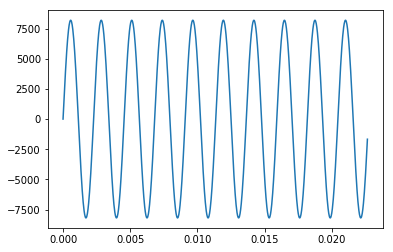

In [2]:
## some consstant for our audio file 

rate = 44100 #44.1 khz
duration =29 # in sec

# this will give us sin with the righ amplitude to use with wav files
normedsin = lambda f,t : 2**13*np.sin(2*np.pi*f*t)

time = np.linspace(0,duration, num=rate*duration)
# define A as a 440 Hz sin function 
la = lambda t : normedsin(440,t)

# look at it on the first 25 ms
plt.plot(time[0:1000], la(time)[0:1000])

In [3]:
from scipy.io import wavfile

In [4]:
wavfile.write('440.wav', rate, la(time).astype(np.int16))

In [5]:
Audio("440.wav")

In [6]:
# fondamental frequency of hydrogen
f0 = const.Rydberg*const.c
print("The highest frequency of hydrogen is ",f0,"Hz. and correspond to n = 1, m = ∞")
fshift = 440
print("we can shift the spectrum for it to be at 440 Hz (A)")

The highest frequency of hydrogen is  3289841960355208.5 Hz. and correspond to n = 1, m = ∞
we can shift the spectrum for it to be at 440 Hz (A)


In [7]:
ryd = lambda n,m : fshift*(1/(n**2) -1/(m**2))
flyman = lambda x : ryd(1,x)
fbalmer = lambda x : ryd(2,x)

In [8]:
## define the sum, 
ser = lambda t : sum( [normedsin(flyman(i),t)+normedsin(fbalmer(i+1),t) for i in range(2,8)])

# and a verorialized function to work on a by element basis with matlab
serv = scipy.vectorize(ser)

In [9]:
ss = serv(time)

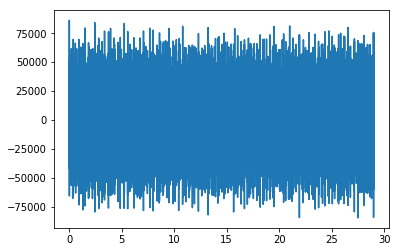

In [10]:
plt.plot(time,ss)
ss = 2**15*ss/ ss.max()

In [11]:
wavfile.write('hydrogen.wav', rate, ss.astype(np.int16))


In [12]:
Audio('hydroge.wav')

# Gaussian Mixture Model HMM

In [59]:
import os

In [60]:
#Files are signed 16 bit raw, sample rate 8000
os.system("cat ./audio/banana/banana01.wav | aplay -f S16_LE -t wav -r 8000")

0

In [61]:
fpaths = []
labels = []
spoken = []
for f in os.listdir('audio'):
    for w in os.listdir('audio/' + f):
        fpaths.append('audio/' + f + '/' + w)
        labels.append(f)
        if f not in spoken:
            spoken.append(f)
print(spoken)

['banana', 'lime', 'apple', 'peach', 'kiwi', 'pineapple', 'orange']


In [62]:
data = np.zeros((len(fpaths), 32000))
maxsize = -1
for n,file in enumerate(fpaths):
    _, d = wavfile.read(file)
    data[n, :d.shape[0]] = d
    if d.shape[0] > maxsize:
        maxsize = d.shape[0]
data = data[:, :maxsize]

In [63]:
#Each sample file is one row in data, and has one entry in labels
print('Samples:', data.shape[0])
all_labels = np.zeros(data.shape[0])
for n, l in enumerate(set(labels)):
    all_labels[np.array([i for i, _ in enumerate(labels) if _ == l])] = n
    
print('Label indices:', all_labels)

Samples: 105
Label indices: [4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 3. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.
 5. 5. 5. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1.]


## GMM-HMM implementation

### Task 1: implement GMM-HMM by Baum-Welch expectation maximization algorithm

Use hint below for your implementation

[Hidden Markov Models
](http://cs.brown.edu/research/ai/dynamics/tutorial/Documents/HiddenMarkovModels.html)

[HMMs Baum-Welch](http://www.biostat.jhsph.edu/bstcourse/bio638/notes/HMMs_BaumWelch.pdf)

HMMs must do three primary tasks:

- State Estimation $P(S | O)$ - can be useful if you have prior info about what states mean and create the state probabilities yourself.
- Path Estimation - given observations, what is the most likely "state path"? Not useful in our case, and not even implemented here!
- Maximum Likelihood Estimation $P(O | \lambda)$ - learn the HMM parameters $\lambda$ which maximize the probability of observations. This is the primary method we will use.

To train the HMM, use the Baum-Welch algorithm.

In [107]:
import scipy.stats as st

class gmmhmm:
    
    def __init__(self, n_states):
        self.n_states = n_states
        self.random_state = np.random.RandomState(42)
        
        # Normalize random initial state
        self.prior = self._normalize(???)
        
        # Stochasticize A matrix
        self.A = self._stochasticize(???)
        
        self.mu = None
        self.covs = None
        self.n_dims = None
           
    def _forward(self, B):
        log_likelihood = 0.
        T = B.shape[1]
        alpha = np.zeros(B.shape)
        for t in range(T):
            # YOUR CODE HERE
            
            
        return log_likelihood, alpha
    
    def _backward(self, B):
        T = B.shape[1]
        beta = np.zeros(B.shape);
           
        beta[:, -1] = np.ones(B.shape[0])
            
        for t in range(T - 1)[::-1]:
            # YOUR CODE HERE
            
        return beta
    
    def _state_likelihood(self, obs):
        obs = np.atleast_2d(obs)
        B = np.zeros((self.n_states, obs.shape[1]))
        for s in range(self.n_states):
            # YOUR CODE HERE
            
        return B
    
    def _normalize(self, x):
        # YOUR CODE HERE
        
        return res
    
    def _stochasticize(self, x):
        # YOUR CODE HERE
        
        return res
    
    def _em_step(self, obs): 
        # YOUR CODE HERE
        
        
        return log_likelihood
    
    def fit(self, obs, n_iter=15):
        #Support for 2D and 3D arrays
        #2D should be n_features, n_dims
        #3D should be n_examples, n_features, n_dims
        #For example, with 6 features per speech segment, 105 different words
        #this array should be size
        #(105, 6, X) where X is the number of frames with features extracted
        #For a single example file, the array should be size (6, X)

        # YOUR CODE HERE
        
        return self
    
    def transform(self, obs):
        #Support for 2D and 3D arrays
        #2D should be n_features, n_dims
        #3D should be n_examples, n_features, n_dims
        #For example, with 6 features per speech segment, 105 different words
        #this array should be size
        #(105, 6, X) where X is the number of frames with features extracted
        #For a single example file, the array should be size (6, X)
        
        # YOUR CODE HERE
        
        return res

### Task 2: test your implementation

In [108]:
rstate = np.random.RandomState(0)
t1 = np.ones((4, 40)) + .001 * rstate.rand(4, 40)
t1 /= t1.sum(axis=0)
t2 = rstate.rand(*t1.shape)
t2 /= t2.sum(axis=0)

m1 = gmmhmm(2)
m1.fit(t1)
m2 = gmmhmm(2)
m2.fit(t2)

m1t1 = m1.transform(t1)
m2t1 = m2.transform(t1)
print("Likelihoods for test set 1")
print("M1:", m1t1)
print("M2:", m2t1)
print("Prediction for test set 1")
print("Model", np.argmax([m1t1, m2t1]) + 1)
print()

m1t2 = m1.transform(t2)
m2t2 = m2.transform(t2)
print("Likelihoods for test set 2")
print("M1:", m1t2)
print("M2:", m2t2)
print("Prediction for test set 2")
print("Model", np.argmax([m1t2, m2t2]) + 1)

Likelihoods for test set 1
M1: 222.72828936741465
M2: 216.23024082992643
Prediction for test set 1
Model 1

Likelihoods for test set 2
M1: 34.53371484741055
M2: 41.03175567769656
Prediction for test set 2
Model 2


## Dataset Models

To predict words, we need to train 7 separate GMM-HMM models, one for each word. We will then feed the features for a test sample into each, choosing the word associated with the GMM-HMM having the highest output likelihood. This maximum likelihood estimate is our best guess for what word was spoken.

### Task 3: train 7 separate models

In [ ]:
# YOUR CODE HERE





### Task 4: check accuracy on train/test split

In [113]:
# YOUR CODE HERE






### Task 5: provide confusion matrix for prediction

In [114]:
# YOUR CODE HERE




